# Assignment 10 — Stable Diffusion Image Generation

**Model:** `runwayml/stable-diffusion-v1-5`  
**Theme:** Nature & Landscapes

---
### Experiments Covered
- A) Prompt Engineering (same seed, different wording)
- B) Negative Prompts
- C) Guidance Scale Sweep
- D) Seed Sweep
- E) Batch Generation

## 0. Install Dependencies

In [1]:
!pip install -q --upgrade diffusers transformers accelerate safetensors
!pip install -q --upgrade xformers

## 1. Imports & GPU Check

In [2]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt
import os
import time

print("GPU available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


GPU available: True
GPU: Tesla T4


## 2. Load the Model

In [3]:
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None
)

pipe = pipe.to("cuda")
pipe.enable_attention_slicing()

print("Model loaded successfully.")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

Model loaded successfully.


## 3. Helper Function — `generate_image`

In [4]:
os.makedirs("outputs", exist_ok=True)

def generate_image(
    prompt,
    negative_prompt="",
    steps=30,
    guidance=7.5,
    seed=42,
    height=512,
    width=512,
    save_name=None
):
    """Generate an image using Stable Diffusion and display + save it."""
    generator = torch.Generator("cuda").manual_seed(seed)

    t0 = time.time()
    result = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt if negative_prompt else None,
        num_inference_steps=steps,
        guidance_scale=guidance,
        generator=generator,
        height=height,
        width=width
    )
    image = result.images[0]
    t1 = time.time()

    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(
        f"Prompt: {prompt[:60]}...\n"
        f"seed={seed}, steps={steps}, guidance={guidance} ({t1-t0:.1f}s)",
        fontsize=9
    )
    plt.tight_layout()
    plt.show()

    if save_name is None:
        save_name = f"img_seed{seed}_steps{steps}_g{guidance}.png"
    path = os.path.join("outputs", save_name)
    image.save(path)
    print(f"Saved: {path}")
    return image

## 4. Baseline — Misty Mountain Valley

  0%|          | 0/35 [00:00<?, ?it/s]

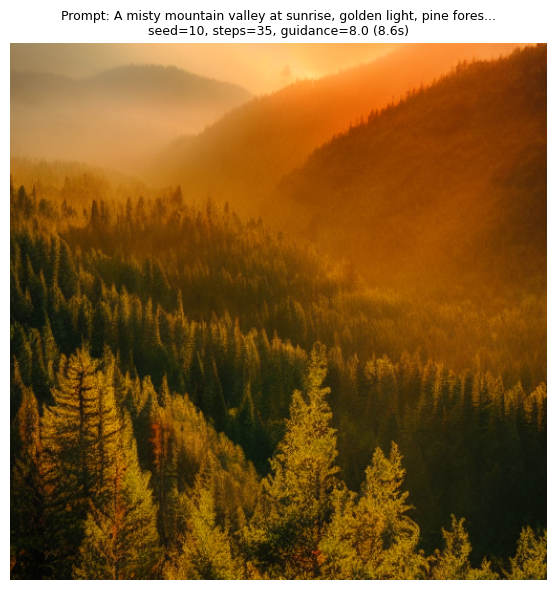

Saved: outputs/mountain_valley.png


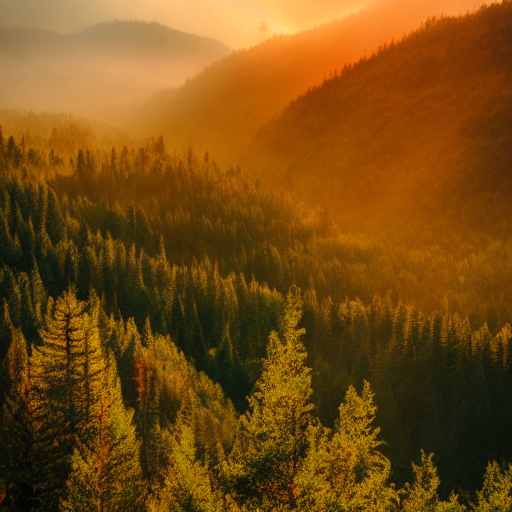

In [5]:
prompt = "A misty mountain valley at sunrise, golden light, pine forests, ultra detailed, landscape photography"
generate_image(prompt, steps=35, guidance=8.0, seed=10, save_name="mountain_valley.png")

## Experiment A — Prompt Engineering
> **Goal:** Same seed, different wording → observe how text encoding changes the image.


--- Prompt Variation 1 ---


  0%|          | 0/30 [00:00<?, ?it/s]

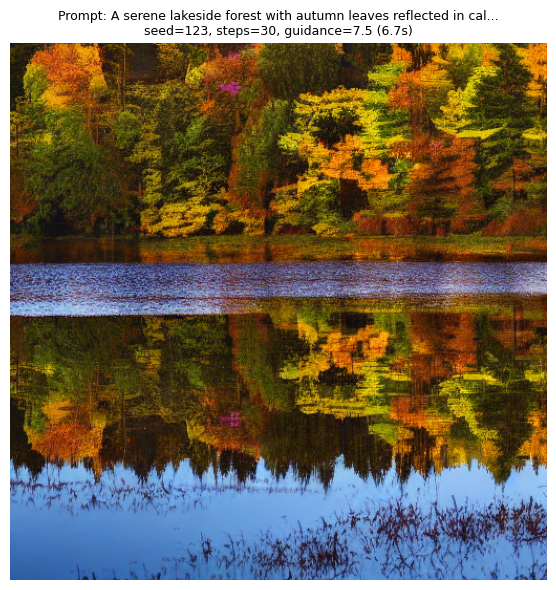

Saved: outputs/prompt_variation_1.png

--- Prompt Variation 2 ---


  0%|          | 0/30 [00:00<?, ?it/s]

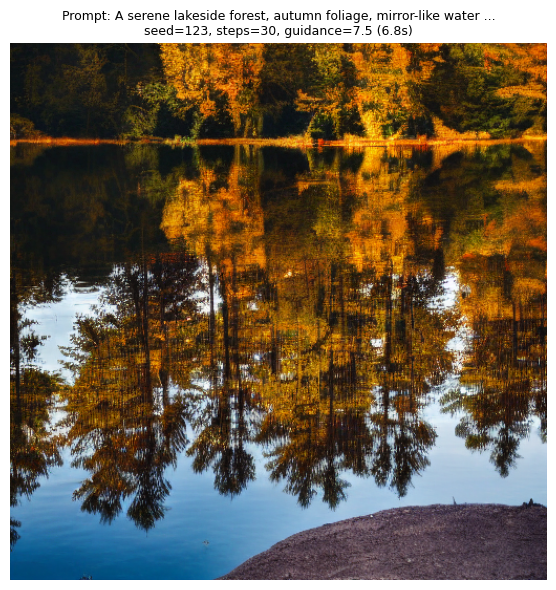

Saved: outputs/prompt_variation_2.png

--- Prompt Variation 3 ---


  0%|          | 0/30 [00:00<?, ?it/s]

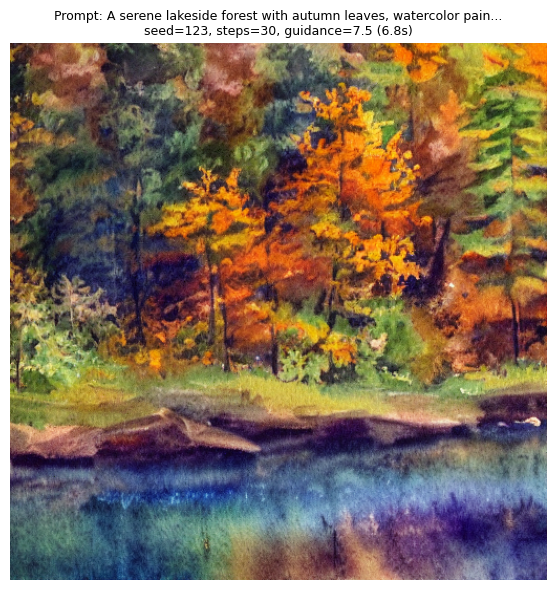

Saved: outputs/prompt_variation_3.png


In [6]:
base_seed = 123

prompts = [
    "A serene lakeside forest with autumn leaves reflected in calm water",
    "A serene lakeside forest, autumn foliage, mirror-like water reflections, cinematic lighting, 35mm photo",
    "A serene lakeside forest with autumn leaves, watercolor painting, soft warm tones, impressionist style"
]

for i, p in enumerate(prompts, 1):
    print(f"\n--- Prompt Variation {i} ---")
    generate_image(p, steps=30, guidance=7.5, seed=base_seed, save_name=f"prompt_variation_{i}.png")

## Experiment B — Negative Prompts
> **Goal:** Reduce unwanted artifacts using a negative prompt.

WITHOUT negative prompt:


  0%|          | 0/35 [00:00<?, ?it/s]

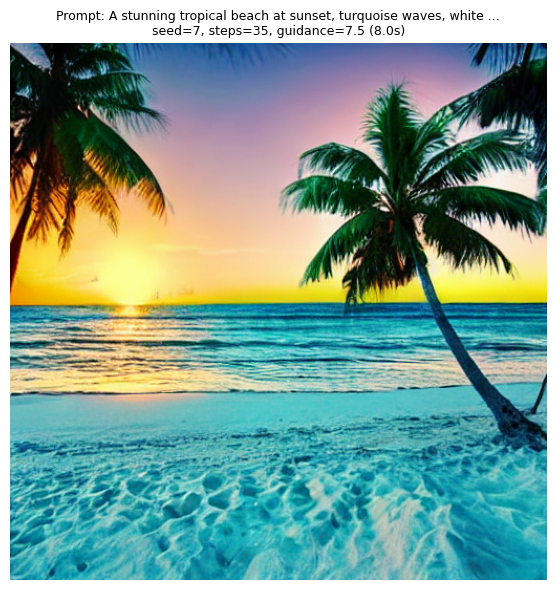

Saved: outputs/beach_no_negative.png
WITH negative prompt:


  0%|          | 0/35 [00:00<?, ?it/s]

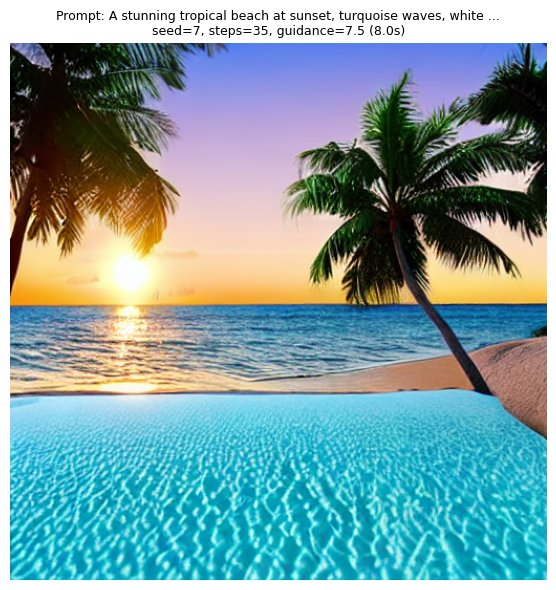

Saved: outputs/beach_with_negative.png


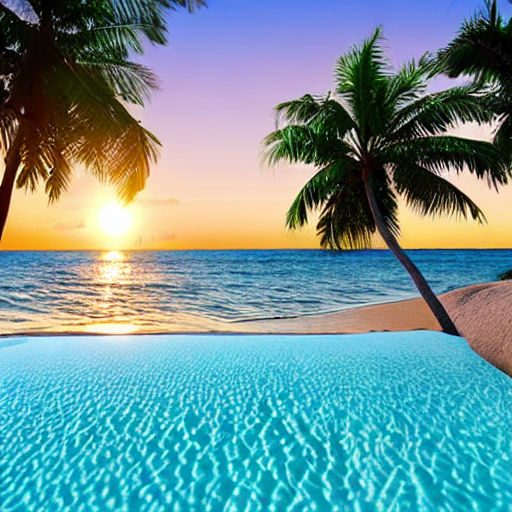

In [7]:
prompt = "A stunning tropical beach at sunset, turquoise waves, white sand, palm trees, photorealistic"
neg    = "blurry, low quality, overexposed, oversaturated, cartoonish, flat, ugly, distorted"

print("WITHOUT negative prompt:")
generate_image(prompt, steps=35, guidance=7.5, seed=7, save_name="beach_no_negative.png")

print("WITH negative prompt:")
generate_image(prompt, negative_prompt=neg, steps=35, guidance=7.5, seed=7, save_name="beach_with_negative.png")

## Experiment C — Guidance Scale Sweep
> **Goal:** See how `guidance_scale` controls how strictly the model follows the prompt.


--- Guidance Scale = 4.0 ---


  0%|          | 0/30 [00:00<?, ?it/s]

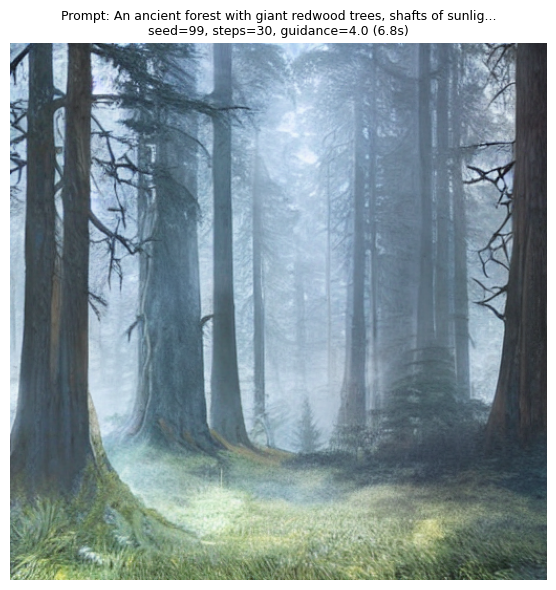

Saved: outputs/guidance_4.0.png

--- Guidance Scale = 7.5 ---


  0%|          | 0/30 [00:00<?, ?it/s]

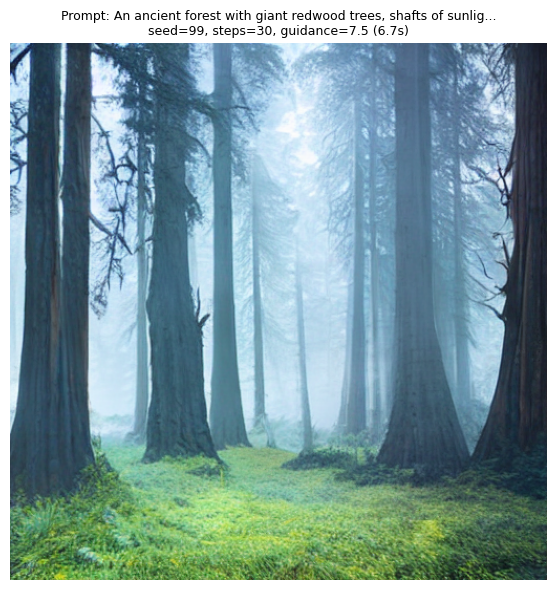

Saved: outputs/guidance_7.5.png

--- Guidance Scale = 10.0 ---


  0%|          | 0/30 [00:00<?, ?it/s]

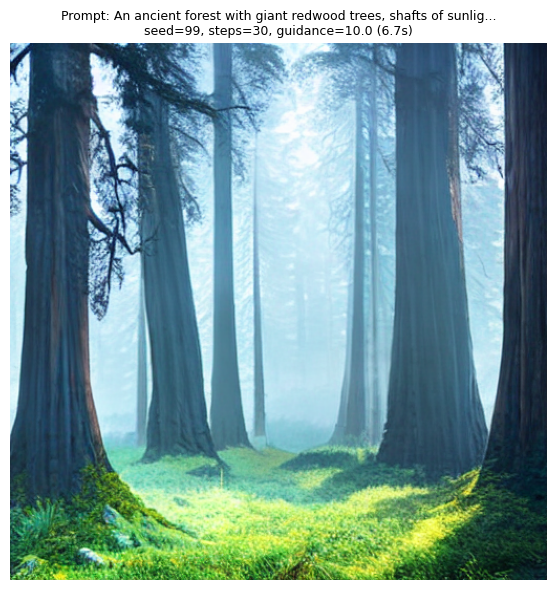

Saved: outputs/guidance_10.0.png

--- Guidance Scale = 12.0 ---


  0%|          | 0/30 [00:00<?, ?it/s]

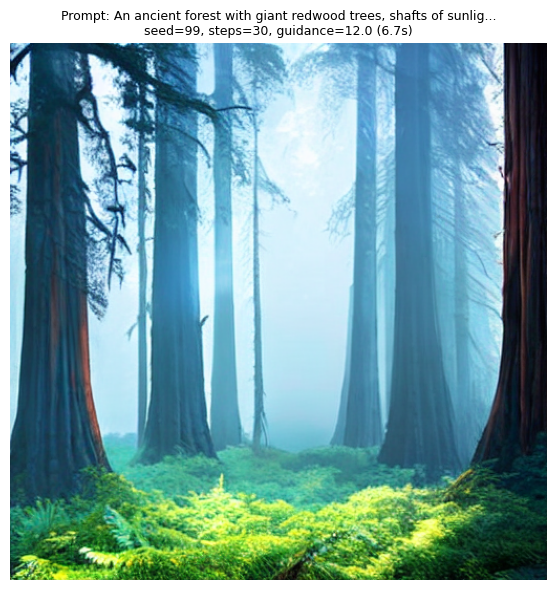

Saved: outputs/guidance_12.0.png


In [8]:
prompt = "An ancient forest with giant redwood trees, shafts of sunlight, misty atmosphere, fantasy art"
seed   = 99

for g in [4.0, 7.5, 10.0, 12.0]:
    print(f"\n--- Guidance Scale = {g} ---")
    generate_image(prompt, steps=30, guidance=g, seed=seed, save_name=f"guidance_{g}.png")

## Experiment D — Seed Sweep
> **Goal:** Same prompt, different seeds → visualize the diversity of outputs.


--- Seed = 1 ---


  0%|          | 0/30 [00:00<?, ?it/s]

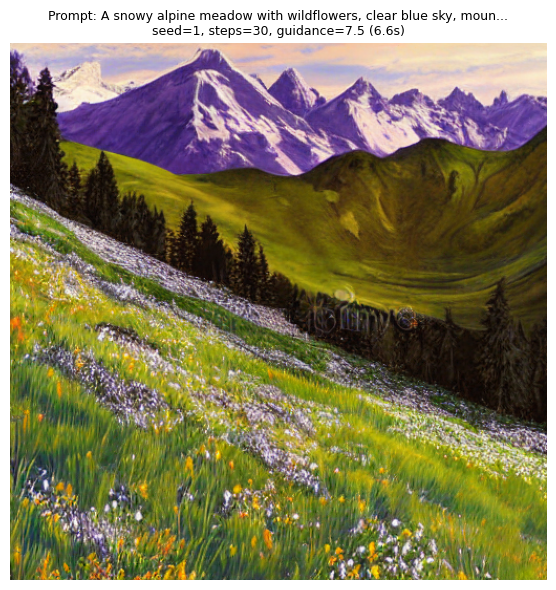

Saved: outputs/seed_1.png

--- Seed = 2 ---


  0%|          | 0/30 [00:00<?, ?it/s]

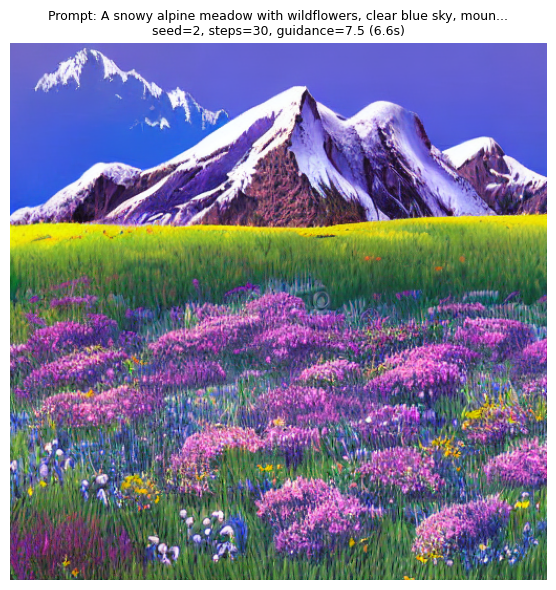

Saved: outputs/seed_2.png

--- Seed = 3 ---


  0%|          | 0/30 [00:00<?, ?it/s]

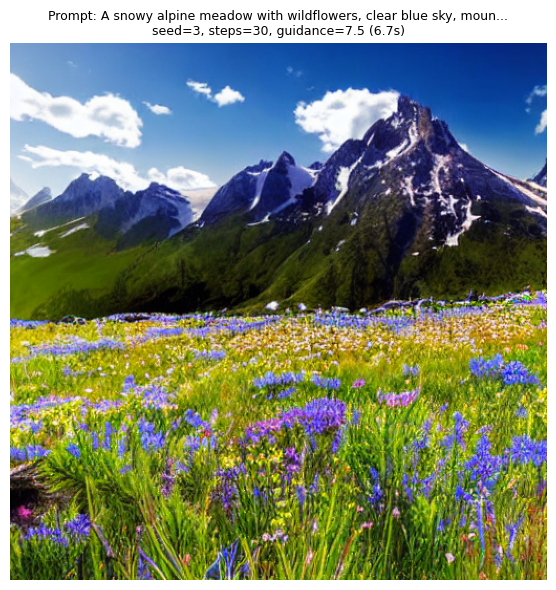

Saved: outputs/seed_3.png

--- Seed = 4 ---


  0%|          | 0/30 [00:00<?, ?it/s]

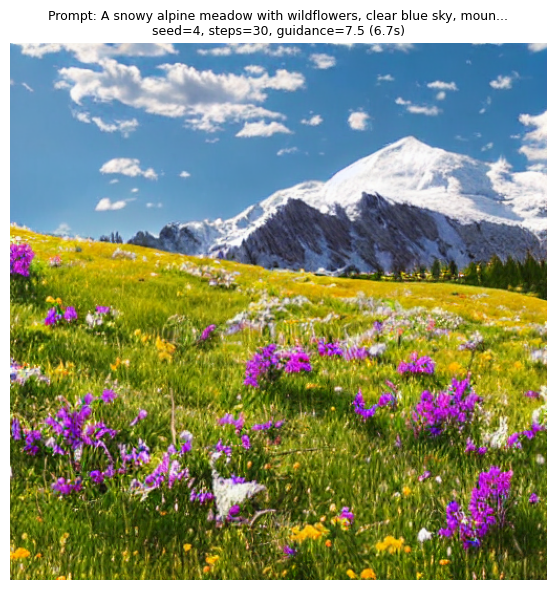

Saved: outputs/seed_4.png


In [9]:
prompt = "A snowy alpine meadow with wildflowers, clear blue sky, mountain peaks in background, detailed illustration"

for s in [1, 2, 3, 4]:
    print(f"\n--- Seed = {s} ---")
    generate_image(prompt, steps=30, guidance=7.5, seed=s, save_name=f"seed_{s}.png")

## Experiment E — Batch Generation
> **Goal:** Generate multiple images quickly using a loop over seeds.


--- Generating storm scene (seed=11) ---


  0%|          | 0/28 [00:00<?, ?it/s]

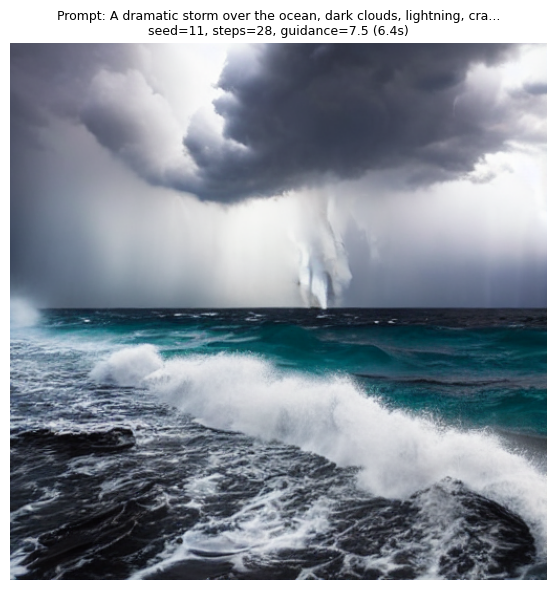

Saved: outputs/storm_11.png

--- Generating storm scene (seed=22) ---


  0%|          | 0/28 [00:00<?, ?it/s]

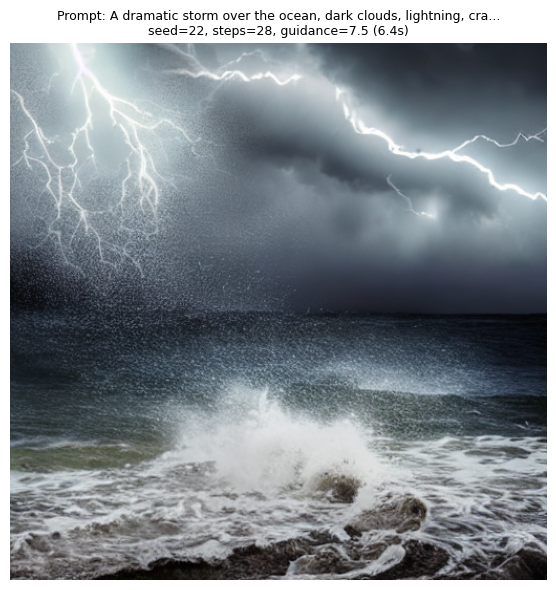

Saved: outputs/storm_22.png

--- Generating storm scene (seed=33) ---


  0%|          | 0/28 [00:00<?, ?it/s]

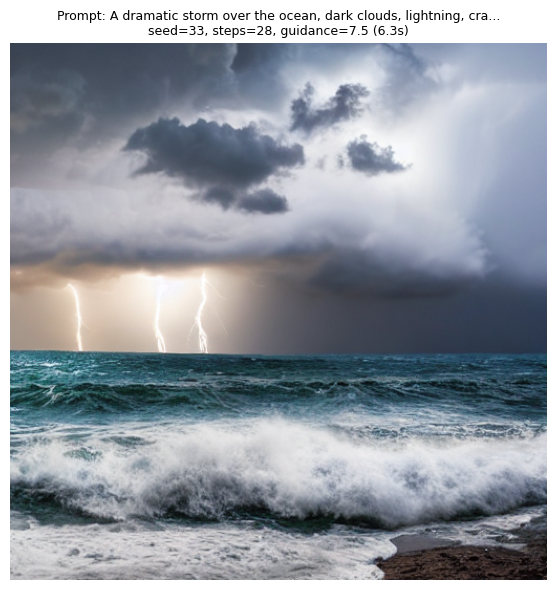

Saved: outputs/storm_33.png

--- Generating storm scene (seed=44) ---


  0%|          | 0/28 [00:00<?, ?it/s]

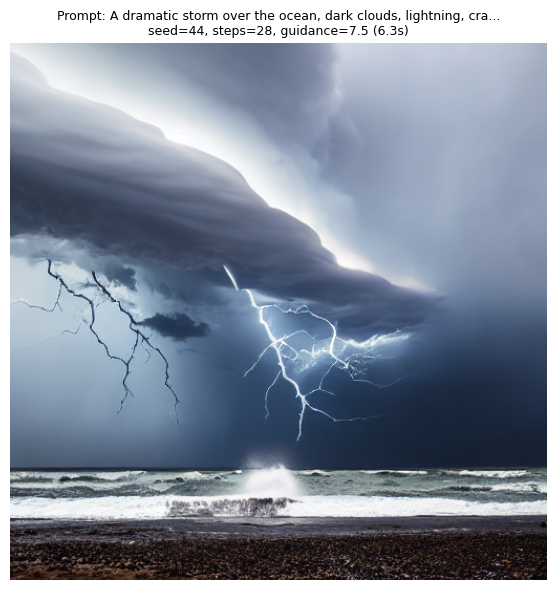

Saved: outputs/storm_44.png

Done! Generated 4 images.


In [10]:
prompt = "A dramatic storm over the ocean, dark clouds, lightning, crashing waves, photorealistic, sharp focus"
neg    = "blurry, low quality, flat, cartoon"
seeds  = [11, 22, 33, 44]

images = []
for s in seeds:
    print(f"\n--- Generating storm scene (seed={s}) ---")
    img = generate_image(prompt, negative_prompt=neg, steps=28, guidance=7.5, seed=s, save_name=f"storm_{s}.png")
    images.append(img)

print(f"\nDone! Generated {len(images)} images.")

## 5. Export All Outputs

In [11]:
!zip -r outputs.zip outputs/
print("All outputs zipped into outputs.zip")

updating: outputs/ (stored 0%)
updating: outputs/guidance_7.5.png (deflated 0%)
updating: outputs/seed_4.png (deflated 0%)
updating: outputs/prompt_variation_2.png (deflated 0%)
updating: outputs/guidance_12.0.png (deflated 0%)
updating: outputs/seed_3.png (deflated 0%)
updating: outputs/seed_1.png (deflated 0%)
updating: outputs/cyberpunk.png (deflated 0%)
updating: outputs/tiger_33.png (deflated 0%)
updating: outputs/guidance_10.0.png (deflated 0%)
updating: outputs/prompt_variation_1.png (deflated 0%)
updating: outputs/tiger_11.png (deflated 0%)
updating: outputs/seed_2.png (deflated 0%)
updating: outputs/tiger_44.png (deflated 0%)
updating: outputs/portrait_with_negative.png (deflated 0%)
updating: outputs/tiger_22.png (deflated 0%)
updating: outputs/guidance_4.0.png (deflated 0%)
updating: outputs/prompt_variation_3.png (deflated 0%)
updating: outputs/portrait_no_negative.png (deflated 0%)
  adding: outputs/storm_44.png (deflated 0%)
  adding: outputs/mountain_valley.png (deflated